 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPC    |
 |    Domain: C                |
📦 Finished downloading [1] files to [/home/jmedinah09/data/noaa-goes16/ABI-L2-MCMIPC].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

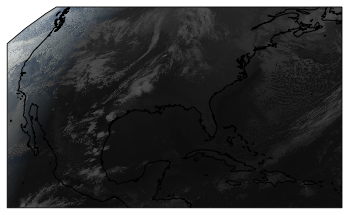

In [2]:
# https://blaylockbk.github.io/goes2go/_build/html/reference_guide/index.html#rgb-recipes
from goes2go.data import goes_latest
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Download a GOES ABI dataset
G = goes_latest(product='ABI')

# Make figure on Cartopy axes
ax = plt.subplot(projection=G.rgb.crs )
ax.imshow(G.rgb.TrueColor(), **G.rgb.imshow_kwargs)
ax.coastlines()

In [3]:
G.attrs

{'naming_authority': 'gov.nesdis.noaa',
 'Conventions': 'CF-1.7',
 'Metadata_Conventions': 'Unidata Dataset Discovery v1.0',
 'standard_name_vocabulary': 'CF Standard Name Table (v35, 20 July 2016)',
 'institution': 'DOC/NOAA/NESDIS > U.S. Department of Commerce, National Oceanic and Atmospheric Administration, National Environmental Satellite, Data, and Information Services',
 'project': 'GOES',
 'production_site': 'NSOF',
 'production_environment': 'OE',
 'spatial_resolution': '2km at nadir',
 'orbital_slot': 'GOES-East',
 'platform_ID': 'G16',
 'instrument_type': 'GOES R Series Advanced Baseline Imager',
 'scene_id': 'CONUS',
 'instrument_ID': 'FM1',
 'iso_series_metadata_id': '8c9e8150-3692-11e3-aa6e-0800200c9a66',
 'keywords_vocabulary': 'NASA Global Change Master Directory (GCMD) Earth Science Keywords, Version 7.0.0.0.0',
 'title': 'ABI L2 Cloud and Moisture Imagery',
 'summary': 'Multiple reflectance and emissive channel Cloud and Moisture Imagery Products are digital maps of c

In [ ]:
# G is an xarray.Dataset of GOES data.
G.FOV.domain  # only ABI datasets
G.FOV.full_disk  # ABI or GLM datasets

G.(.crs  # Cartopy coordinate reference system for the satellite.

<Derived Projected CRS: +proj=geos +a=6378137.0 +b=6356752.31414 +rf=298.2 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Geostationary Satellite (Sweep X)
Datum: unknown
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [4]:
from goes2go.data import goes_nearesttime

from datetime import datetime, timedelta
import pandas as pd

g = goes_nearesttime(datetime(2018, 12, 25, 10),
                     satellite='goes16',
                     product='ABI',
                     return_as='xarray')


 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPC    |
 |    Domain: C                |
📦 Finished downloading [1] files to [/home/jmedinah09/data/noaa-goes16/ABI-L2-MCMIPC].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [5]:
from goes2go.data import goes_nearesttime, goes_latest
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

# Function from Carpenter_Workshop: https://github.com/blaylockbk/Carpenter_Workshop
from toolbox.cartopy_tools import common_features

In [6]:
G16 = goes_nearesttime('2020-9-22 18')
G17 = goes_nearesttime('2020-9-22 18', satellite=17)

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPC    |
 |    Domain: C                |
📦 Finished downloading [1] files to [/home/jmedinah09/data/noaa-goes16/ABI-L2-MCMIPC].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

/home/jmedinah09/miniconda3/envs/goes2go/lib/python3.9/site-packages/goes2go/accessors.py:1174: UserWarning: THE `NormalizedBurnRatio` FUNCTION IS NOT FULLY DEVELOPED. NEED MORE INFO.
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


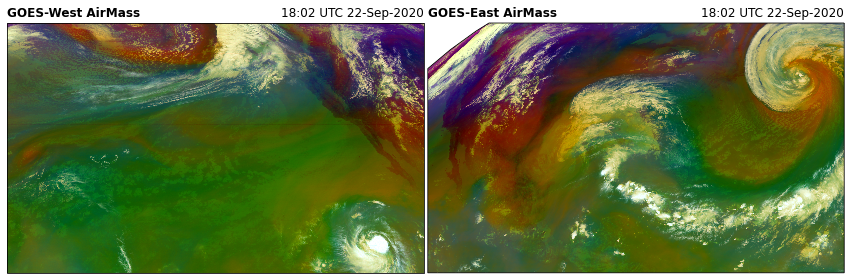

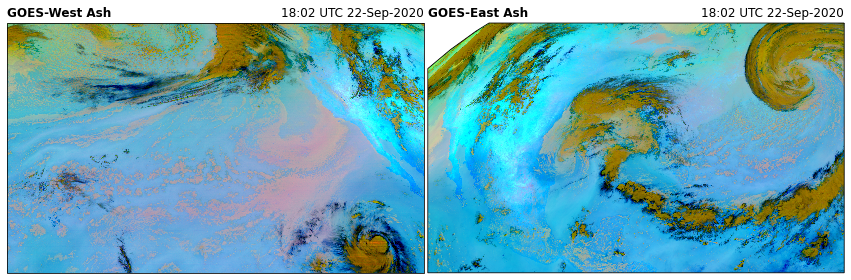

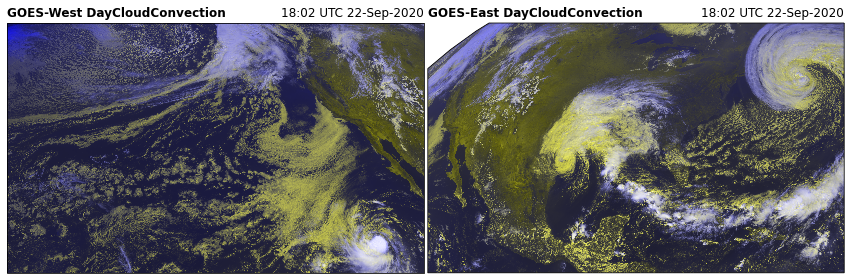

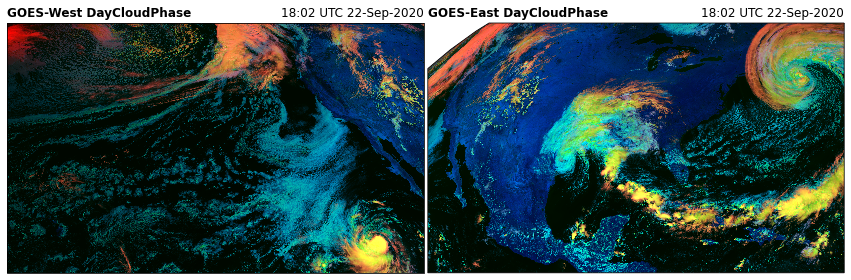

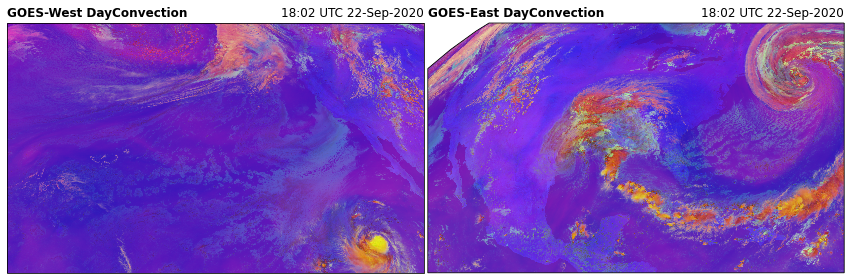

...

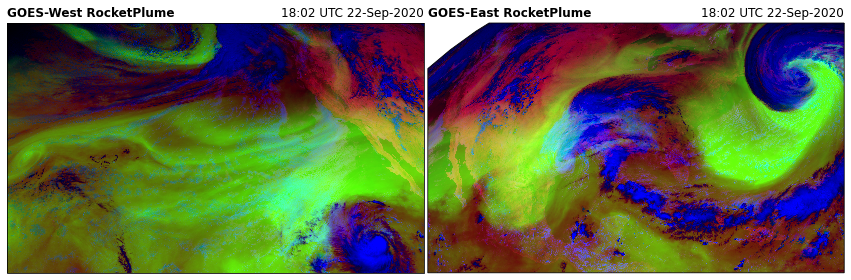

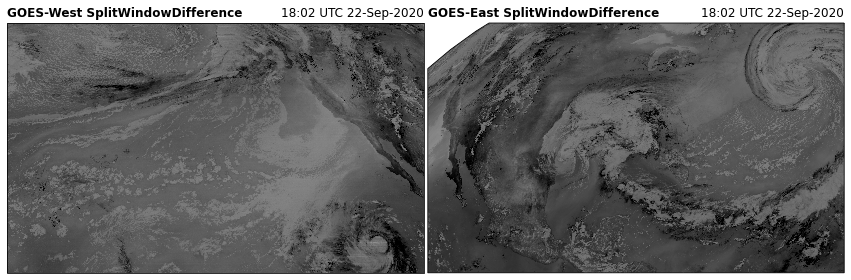

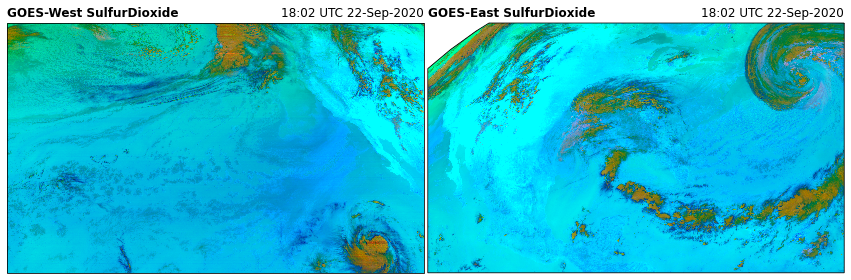

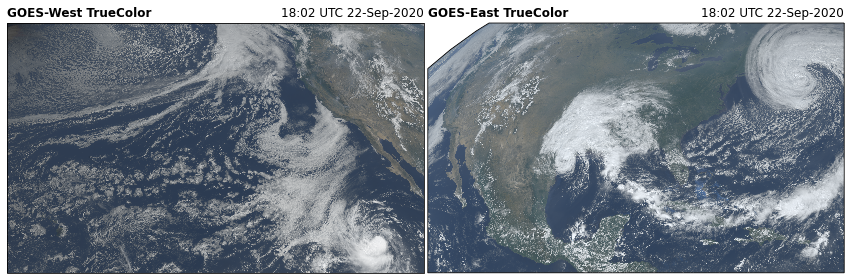

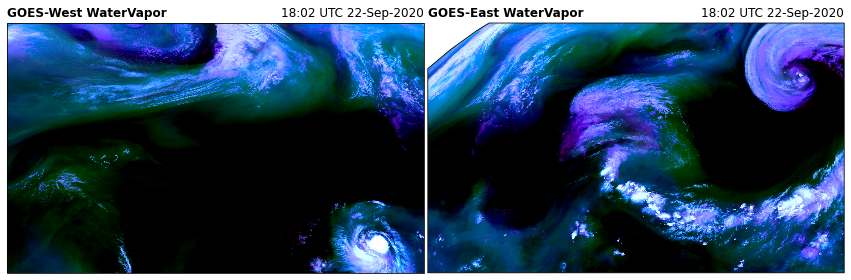

In [18]:
rgb_products = [i for i in dir(G16.rgb) if i[0].isupper()]

for product in rgb_products:

    fig = plt.figure(figsize=(15, 12))
    ax17 = fig.add_subplot(1, 2, 1, projection=G17.rgb.crs)
    ax16 = fig.add_subplot(1, 2, 2, projection=G16.rgb.crs)

    for ax, G in zip([ax17, ax16], [G17, G16]):
        RGB = getattr(G.rgb, product)()

        # common_features('50m', STATES=True, ax=ax)
        ax.imshow(RGB, **G.rgb.imshow_kwargs)
        ax.set_title(f"{G.orbital_slot} {product}", loc='left', fontweight='bold')
        ax.set_title(f"{G.t.dt.strftime('%H:%M UTC %d-%b-%Y').item()}", loc="right")
    plt.subplots_adjust(wspace=0.01)
    plt.savefig(f'./{product}', bbox_inches='tight')

In [13]:
rgb_products = [i for i in dir(G16.rgb) if i[0].isupper()]

In [23]:
dir(G16)
type(G16.rgb)

goes2go.accessors.rgbAccessor